# **AN2DL Second Challenge**
> ## ***Ibuprofen*** team

## 🌐 **Google Drive Connection**

In [1]:
from google.colab import drive
drive.mount("/gdrive")

working_dir = "/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/cleanup"
input_dir = "/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2"

%cd $working_dir

print(f"Working at folder: {working_dir}")
print(f"Input at folder: {input_dir}")

Mounted at /gdrive
/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/cleanup
Working at folder: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/cleanup
Input at folder: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2


---
## ⚙️ **Libraries Import**

In [2]:
# Set seed for reproducibility
SEED = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(SEED)
random.seed(SEED)

# Import PyTorch
import torch
torch.manual_seed(SEED)
from torch import nn
from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision.transforms import v2 as transforms
from torch.utils.data import TensorDataset, DataLoader, Dataset
!pip install torchview
from torchview import draw_graph

# Configurazione di TensorBoard e directory
logs_dir = "tensorboard"
!pkill -f tensorboard
%load_ext tensorboard
!mkdir -p models

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True
else:
    device = torch.device("cpu")

print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")

# Import other libraries
import cv2
import copy
import shutil
from itertools import product
import pandas as pd
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.gridspec as gridspec
import requests
from io import BytesIO
import shutil
from tqdm import tqdm  # Progress bar

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

PyTorch version: 2.9.0+cu126
Device: cpu


---
## ⏳ **Data unzip**

In [4]:
dataset_name = "an2dl2526c2v2"

dataset_zip = f"{input_dir}/{dataset_name}.zip"
dataset_dir = f"{input_dir}/grumpy-doctogres"


#===============================================================================
# --- UNZIP --------------------------------------------------------------------
#===============================================================================
# Check if data directory exists
if not os.path.exists(dataset_dir):
  print(f"Dataset folder '{dataset_dir}' not found. Checking for zip file...")
  # Check if zip file exists
  if os.path.exists(dataset_zip):
    print(f"Zip file '{dataset_zip}' found. Unzipping...")
    try:
      !unzip -q "{dataset_zip}" -d "{dataset_dir}/"
      print(f"Dataset '{dataset_name}' unzipped successfully to '{dataset_dir}'.")
    except Exception as e:
      print(f"Error during unzipping '{dataset_zip}': {e}")
      print("Data loading aborted due to unzipping error.")
  else:
    print(f"Error: Zip file '{dataset_zip}' not found. Cannot load data.")
else:
  print(f"Dataset folder found for '{dataset_name}': {dataset_dir}.")

Dataset folder '/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres' not found. Checking for zip file...
Zip file '/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/an2dl2526c2v2.zip' found. Unzipping...
Dataset 'an2dl2526c2v2' unzipped successfully to '/gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres'.


## 📥 **Dataset class and raw data loading**

In [20]:
class GrumpyDoctogresDataset(Dataset):
    def __init__(self, root_dir, mode='train',
                 data_dir=None, labels_df=None, filter_indices=None,
                 transform=None):
        """
        Args:
            root_dir (str): Path to the dataset root.
            mode (str): 'train' or 'test'.
            data_dir (str): Name of the training/test directory
            labels_df (pd.DataFrame): The pandas DataFrame containing the labels (required for mode='train').
            filter_indices (list, optional): List of indices to keep from the dataframe.
            transform (callable, optional): Transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.mode = mode
        self.transform = transform

        self.label_mapping = {
            'Luminal A': 0,
            'Luminal B': 1,
            'HER2(+)': 2,
            'Triple negative': 3
        }

        # Setup paths
        self.data_dir = os.path.join(root_dir, data_dir)

        # Initialize lists
        self.image_filenames = []
        self.mask_filenames = []
        self.labels = []

        if self.mode == 'train':
            if labels_df is None:
                raise ValueError("For mode='train', you must provide 'labels_df'.")

            # Work on a copy to avoid side effects
            self.df_labels = labels_df.copy()

            # Apply filter (Train/Val split)
            if filter_indices is not None:
                self.df_labels = self.df_labels.iloc[filter_indices].reset_index(drop=True)
                print(f"ℹ️ Subset initialized: {len(self.df_labels)} samples.")

            # 'sample_index' contains "img_XXXX.png"
            self.image_filenames = self.df_labels['sample_index'].tolist()
            self.labels = self.df_labels['label'].tolist()

            # Logic: "img_XXXX.png" -> "mask_XXXX.png"
            self.mask_filenames = [
                f.replace("img_", "mask_") for f in self.image_filenames
            ]

        elif self.mode == 'test':
            # In test mode, we scan the directory
            all_files = sorted(os.listdir(self.data_dir))

            # STRICT FILTER: Keep only files starting with "img_" and ending with .png
            self.image_filenames = [
                f for f in all_files
                if f.startswith('img_') and f.endswith('.png')
            ]

            # Generate mask filenames for test set as well
            self.mask_filenames = [
                f.replace("img_", "mask_") for f in self.image_filenames
            ]

    def __len__(self):
        return len(self.image_filenames)

    def info(self, idx):
        sample = {
            'image': self.image(idx),
            'mask': self.mask(idx),
            'img_filename': self.image_filenames[idx],
            'mask_filename': self.mask_filenames[idx]
        }

        if self.mode == 'train':
            label_str = self.labels[idx]
            label = self.label_mapping[label_str]

            sample['label_str'] = label_str
            sample['label'] = torch.tensor(label, dtype=torch.long)

        # 6. Apply Transforms
        if self.transform:
            sample = self.transform(sample)

        return sample

    def image(self, idx):
        img_filename = self.image_filenames[idx]
        img_path = os.path.join(self.data_dir, img_filename)

        image = cv2.imread(img_path)
        if image is None:
             raise FileNotFoundError(f"Image not found at {img_path}")

        # BGR -> RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # [0,256] -> [0,1]
        image = (image / 255).astype(np.float32)

        return image

    def mask(self, idx):
        mask_filename = self.mask_filenames[idx]
        mask_path = os.path.join(self.data_dir, mask_filename)

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
              # Fallback if file exists but is corrupted
              image = self.image(idx)
              mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        else:
            _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
        return mask


# Load training dataset for EDA
ds_train = GrumpyDoctogresDataset(
    mode='train', root_dir=dataset_dir,
    data_dir='train_data',
    labels_df=pd.read_csv(os.path.join(dataset_dir, 'train_labels.csv')))
print(f"Loaded {len(ds_train)} training samples.")

Loaded 691 training samples.


---
## 🔎 **Data inspection**

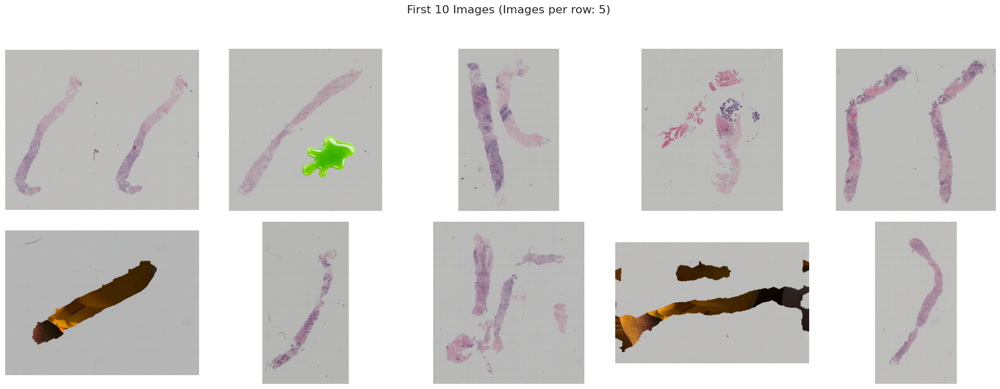

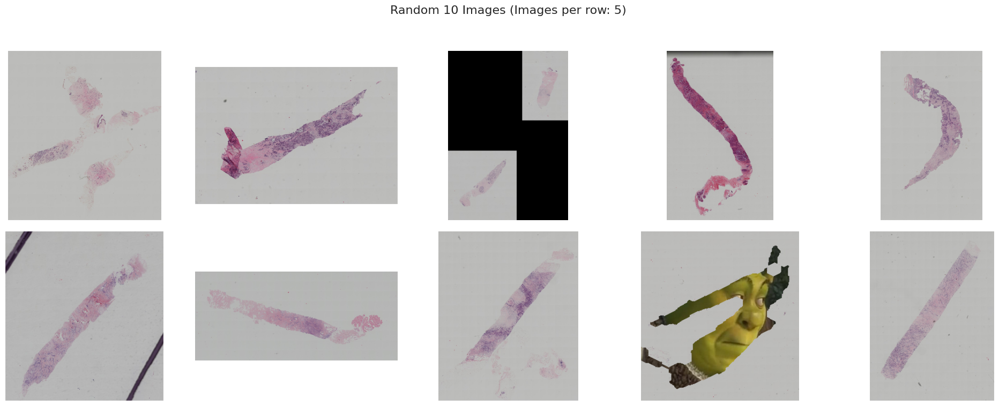

In [6]:
def plot_images_from_dataset(dataset, indices, title, images_per_row):
    num_images = len(indices)
    rows = math.ceil(num_images / images_per_row)

    fig, axes = plt.subplots(rows, images_per_row, figsize=(20, rows * 4))
    fig.suptitle(title, fontsize=16)

    if rows == 1 and images_per_row == 1:
        axes = [axes]
    elif rows == 1:
        # If only one row but multiple columns, axes is a 1D array
        pass
    else:
        axes = axes.flatten()

    for i, idx in enumerate(indices):
        ax = axes[i]
        ax.imshow(np.clip(dataset.image(idx), 0, 1))
        ax.axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make space for suptitle
    plt.show()


images_per_row = 5 # Customize the number of images per row here

# --- Plotting the first 'images_per_row' images ---
num_first_images = 10
initial_image_indices = list(range(num_first_images))
plot_images_from_dataset(
    ds_train,
    initial_image_indices,
    f"First {num_first_images} Images (Images per row: {images_per_row})",
    images_per_row
)

print("\n\n")

# --- Plotting 'images_per_row' random images ---
num_random_images = 10
# Generate random indices
total_train_images = len(ds_train)
random_indices = random.sample(range(total_train_images), num_random_images)
plot_images_from_dataset(
    ds_train,
    random_indices,
    f"Random {num_random_images} Images (Images per row: {images_per_row})",
    images_per_row
)

---
## 🦠 **Spotting splatters**

In [7]:
splatter_images = []  # (idx, image_id, ratio)

# --- 1. Green Splatter Detection ---
def detect_green_splatter(image_rgb):
    """
    Detects bright, artificial green splatters using HSV thresholding.
    Input: image_rgb (numpy array, float32 [0,1] or uint8 [0,255])
    """
    # Convert from [0,1] float back to [0,255] uint8 for OpenCV
    if image_rgb.dtype == np.float32 or image_rgb.max() <= 1.0:
        image_uint8 = (image_rgb * 255).astype(np.uint8)
    else:
        image_uint8 = image_rgb.astype(np.uint8)

    # Convert RGB -> HSV
    hsv = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2HSV)

    # "Neon Green" range
    # Hue: 40-80 (Centered on Green=60)
    # Saturation: > 100 (Must be colorful, ignores gray/white background)
    # Value: > 100 (Must be bright, ignores dark shadows)
    lower_green = np.array([40, 100, 100])
    upper_green = np.array([80, 255, 255])

    # Create Mask
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Calculate Ratio (Green Pixels / Total Pixels)
    green_ratio = np.count_nonzero(mask) / mask.size

    # Threshold: 3% (0.03) is enough to flag a splatter
    return green_ratio > 0.03, green_ratio


# --- 2. Invocation & Scanning ---
print(f"🚀 Scanning {len(ds_train)} images for green splatters...")

for idx in tqdm(range(len(ds_train))):
    # Retrieve image using your class method (returns RGB float32)
    img = ds_train.image(idx)

    is_splatter, ratio = detect_green_splatter(img)

    if is_splatter:
        # Extract ID
        full_filename = ds_train.image_filenames[idx]
        image_id = os.path.splitext(full_filename)[0]

        # Store tuple: (index, id, ratio)
        splatter_images.append((idx, image_id, ratio))

print("\n--- Summary ---")
print(f"☢️ Splatter files detected: {len(splatter_images)}")
print("Done.")

🚀 Scanning 691 images for green splatters...


100%|██████████| 691/691 [00:59<00:00, 11.56it/s]


--- Summary ---
☢️ Splatter files detected: 50
Done.


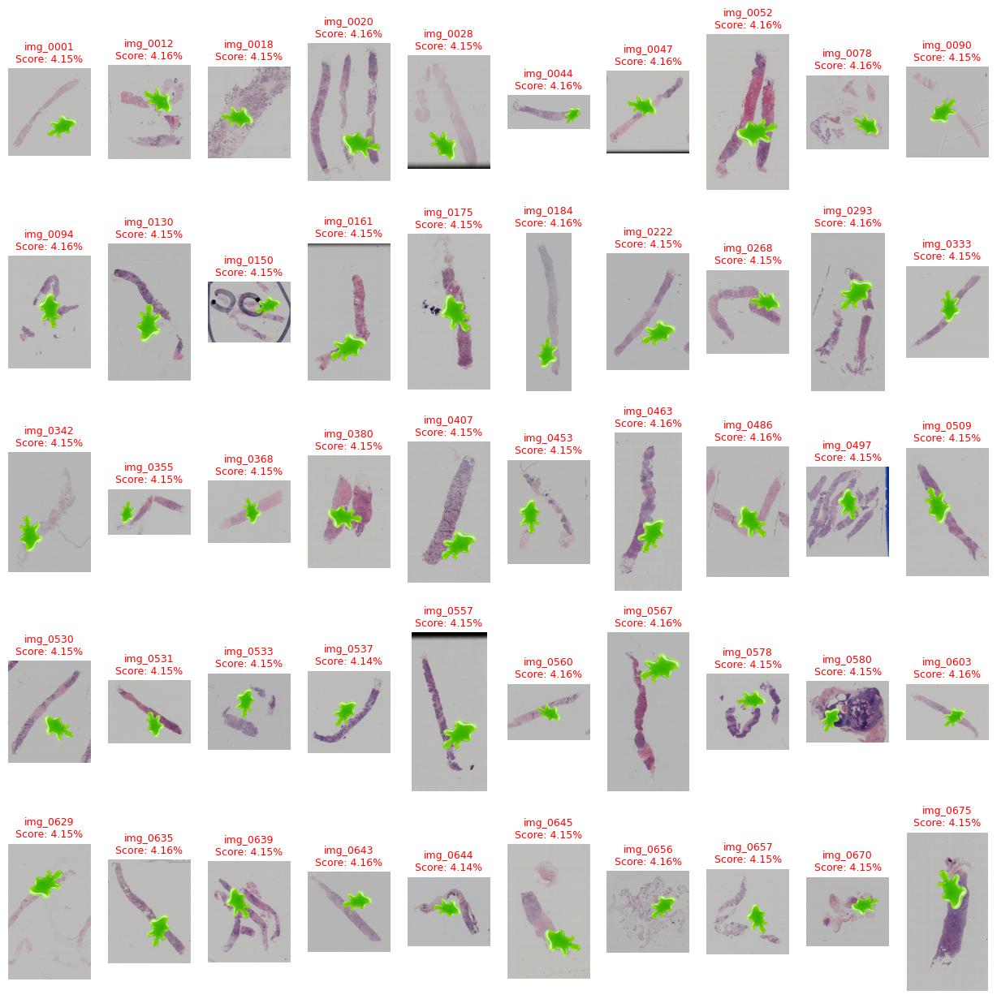

In [8]:
# --- 3. Plotting Miniatures ---
if len(splatter_images) > 0:
    # Configure Grid
    cols = 10
    rows = math.ceil(len(splatter_images) / cols)

    # Create Figure
    fig, axes = plt.subplots(rows, cols, figsize=(12.5, 2.5 * rows))

    # Flatten axes array for easy iteration (handles single row case too)
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (idx, img_id, ratio) in enumerate(splatter_images):
        # Fetch image again for visualization
        img = ds_train.image(idx)

        ax = axes[i]
        ax.imshow(img)
        # Title with ID and Green Score
        ax.set_title(f"{img_id}\nScore: {ratio:.2%}", fontsize=9, color='red')
        ax.axis('off')

    # Turn off any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No splatters detected. Try lowering the threshold if you are sure they exist.")

### 🧹 **Cleanup dataset, segregate splatter**

In [9]:
# --- Configuration ---
# Source directory (where your original train_data is)
SOURCE_DIR = ds_train.data_dir  # e.g., .../train_data
# Destination directories
CLEAN_DIR = os.path.join(ds_train.root_dir, 'train_data_splatter_free')
SPLATTER_DIR = os.path.join(ds_train.root_dir, 'train_data_splatter')

# Create directories if they don't exist
os.makedirs(CLEAN_DIR, exist_ok=True)
os.makedirs(SPLATTER_DIR, exist_ok=True)

print(f"📂 Source: {SOURCE_DIR}")
print(f"✅ Clean Dest: {CLEAN_DIR}")
print(f"☢️ Splatter Dest: {SPLATTER_DIR}")

# --- Preparation ---
# 1. Create a set of Splatter IDs for O(1) fast lookup
# splatter_images is a list of tuples: (index, image_id, ratio)
# We assume image_id is "img_XXXX" (without extension)
splatter_ids_set = set([item[1] for item in splatter_images])

# 2. Get list of all files in source
all_files = os.listdir(SOURCE_DIR)

# --- Execution ---
print("\n🚀 Starting Copy Process...")

copy_count_clean = 0
copy_count_splatter = 0

for filename in tqdm(all_files):
    # Skip non-files (directories) if any
    if not os.path.isfile(os.path.join(SOURCE_DIR, filename)):
        continue

    # We only care about images/masks, not random system files
    # Check if it's an image or a mask belonging to an image
    name_without_ext = os.path.splitext(filename)[0]

    # Heuristic: Check if the file is associated with a splatter ID
    # If filename is "img_0123.png", ID is "img_0123" -> Check set
    # If filename is "mask_0123.png", we need to map it to "img_0123" to check set

    is_splatter = False

    if filename.startswith("img_"):
        if name_without_ext in splatter_ids_set:
            is_splatter = True

    elif filename.startswith("mask_"):
        # Convert "mask_0123" -> "img_0123" to check against our splatter list
        associated_img_id = name_without_ext.replace("mask_", "img_")
        if associated_img_id in splatter_ids_set:
            is_splatter = True

    # Construct paths
    src_path = os.path.join(SOURCE_DIR, filename)

    if is_splatter:
        dst_path = os.path.join(SPLATTER_DIR, filename)
        shutil.copy2(src_path, dst_path) # copy2 preserves metadata
        copy_count_splatter += 1
    else:
        dst_path = os.path.join(CLEAN_DIR, filename)
        shutil.copy2(src_path, dst_path)
        copy_count_clean += 1

print("\n--- Summary ---")
print(f"✅ Clean files copied: {copy_count_clean}")
print(f"☢️ Splatter files copied: {copy_count_splatter}")
print("Done.")

📂 Source: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data
✅ Clean Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data_splatter_free
☢️ Splatter Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data_splatter

🚀 Starting Copy Process...


100%|██████████| 1382/1382 [00:57<00:00, 24.13it/s]


--- Summary ---
✅ Clean files copied: 1282
☢️ Splatter files copied: 100
Done.


In [10]:
# --- Configuration ---
original_csv_path = os.path.join(ds_train.root_dir, 'train_labels.csv')
new_csv_path = os.path.join(ds_train.root_dir, 'train_labels_splatter_free.csv')

# --- Execution ---
print(f"Reading labels from: {original_csv_path}")
df = pd.read_csv(original_csv_path)
initial_count = len(df)

# 1. Create a Set of "Bad" IDs for fast lookup
# splatter_images contains tuples like (index, "img_1234", score)
# We extracted the ID without extension previously.
bad_ids_set = set([item[1] for item in splatter_images])

print(f"Filtering out {len(bad_ids_set)} splatter images...")

# 2. Filter the DataFrame
# We need to extract the ID from the CSV 'sample_index' (which is "img_XXXX.png")
# to match the IDs in our bad_ids_set (which is "img_XXXX")

def extract_id(filename):
    return os.path.splitext(filename)[0]

# Create a boolean mask: True if the row's ID is in the bad set
# We use apply() to handle the extension stripping safely
mask_is_splatter = df['sample_index'].apply(extract_id).isin(bad_ids_set)

# Select rows that are NOT splatters (~)
df_clean = df[~mask_is_splatter].copy()

# 3. Save the new CSV
df_clean.to_csv(new_csv_path, index=False)

# --- Summary ---
print("\n--- CSV Creation Summary ---")
print(f"Original rows:  {initial_count}")
print(f"Removed rows:   {mask_is_splatter.sum()}")
print(f"Remaining rows: {len(df_clean)}")
print(f"✅ Labels Dest: {new_csv_path}")

# Sanity Check: Print first few rows of the new CSV
print("\nHead of new CSV:")
print(df_clean.head())

Reading labels from: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_labels.csv
Filtering out 50 splatter images...

--- CSV Creation Summary ---
Original rows:  691
Removed rows:   50
Remaining rows: 641
✅ Labels Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_labels_splatter_free.csv

Head of new CSV:
   sample_index            label
0  img_0000.png  Triple negative
2  img_0002.png        Luminal B
3  img_0003.png        Luminal B
4  img_0004.png        Luminal B
5  img_0005.png          HER2(+)


## 📥 **Splatter-free data loading**

In [11]:
# Load splatter-free dataset
ds_train_splatter_free = GrumpyDoctogresDataset(
    mode='train', root_dir=dataset_dir,
    data_dir='train_data_splatter_free',
    labels_df=pd.read_csv(os.path.join(dataset_dir, 'train_labels_splatter_free.csv')))
print(f"Loaded {len(ds_train_splatter_free)} training samples.")

Loaded 641 training samples.


## 🧌 **Spotting Shrek side-eye (🫣 smirk, 😏 rizz)**

In [12]:
shrek_images = []  # (idx, image_id, ratio)

# --- 1. Shrek Detection ---
def detect_shrek(image_rgb):
    """
    Detects Shrek skin and vest tones distinct from H&E tissue, using HSV thresholding.
    Input: image_rgb (numpy array, float32 [0,1] or uint8 [0,255])
    """
    # Convert from [0,1] float back to [0,255] uint8 for OpenCV
    if image_rgb.dtype == np.float32 or image_rgb.max() <= 1.0:
        image_uint8 = (image_rgb * 255).astype(np.uint8)
    else:
        image_uint8 = image_rgb.astype(np.uint8)

    # Convert RGB -> HSV
    hsv = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2HSV)

    # "Shrek Skin" range
    # Shrek is more Yellow-Green and less saturate and bright than the previous Neon Green
    # Hue: 20-60 (Yellow-Green range)
    # Saturation: > 40 (Avoids gray background)
    # Value: > 40 (Avoids pure black)
    lower_skin = np.array([20, 40, 40])
    upper_skin = np.array([60, 255, 255])
    mask = cv2.inRange(hsv, lower_skin, upper_skin)

    # Calculate Ratio (Ogre Pixels / Total Pixels)
    ratio = np.count_nonzero(mask) / mask.size

    # Threshold: 0.1% (0.001) is enough to flag a Shrek
    return ratio > 0.001, ratio

# --- Shrek brown vest Detection ---
def detect_shrek_vest(image_rgb):
    """
    Detects 'Vest Brown' tones distinct from H&E tissue, using HSV thresholding.
    Input: image_rgb (numpy array, float32 [0,1] or uint8 [0,255])
    """
    # Convert from [0,1] float back to [0,255] uint8 for OpenCV
    if image_rgb.dtype == np.float32 or image_rgb.max() <= 1.0:
        image_uint8 = (image_rgb * 255).astype(np.uint8)
    else:
        image_uint8 = image_rgb.astype(np.uint8)

    # Convert RGB -> HSV
    hsv = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2HSV)

    # "Vest Brown" range
    # Hue: 10-30 (Orange-ish/Brown)
    # Saturation: 20-150 (Low to Medium saturation - "dirty" look)
    # Value: 20-150 (Darker tones)
    lower_brown = np.array([10, 30, 30])
    upper_brown = np.array([35, 180, 150])

    # Create Mask
    mask = cv2.inRange(hsv, lower_brown, upper_brown)

    # Calculate Ratio (Ogre Pixels / Total Pixels)
    vest_ratio = np.count_nonzero(mask) / mask.size

    # Threshold: 0.5% (0.005) is enough to flag a Shrek vest
    return vest_ratio > 0.005, vest_ratio

def detect_residual_golden(image_rgb):
    """
    Detects the specific 'Golden Strips' and 'Dark Blobs' (from Shrek rizz) that survived previous filters, using HSV thresholding.
    Input: image_rgb (numpy array, float32 [0,1] or uint8 [0,255])
    """
    if image_rgb.dtype == np.float32:
        image_uint8 = (image_rgb * 255).astype(np.uint8)
    else:
        image_uint8 = image_rgb

    hsv = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2HSV)

    # --- 2. THE "GOLDEN" FILTER  ---
    # Detects bright, saturated Golden/Yellow.
    # Hue: 15-40 (Orange to Yellow) - This may overlaps with tissue hue!
    # SAFETY: We enforce Saturation > 120.
    # Tissue is pink/orange but usually low saturation (pastel).
    # Shrek's skin is vivid.
    lower_gold = np.array([15, 120, 60])
    upper_gold = np.array([40, 255, 255])
    mask_gold = cv2.inRange(hsv, lower_gold, upper_gold)

    ratio = np.count_nonzero(mask_gold) / mask_gold.size

    # Threshold: 3% (0.03) is enough to flag a golden Shrek
    return ratio > 0.03, ratio


# --- 2. Invocation & Scanning ---
print(f"🚀 Scanning {len(ds_train_splatter_free)} images for Shrek...")

for idx in tqdm(range(len(ds_train_splatter_free))):
    # Retrieve image using your class method (returns RGB float32)
    img = ds_train_splatter_free.image(idx)

    is_shrek, shrek_ratio = detect_shrek(img)
    is_shrek_vest, shrek_vest_ratio = detect_shrek_vest(img)
    is_residual, gold_ratio = detect_residual_golden(img)

    if is_shrek or is_shrek_vest or is_residual:
        # Extract ID
        full_filename = ds_train_splatter_free.image_filenames[idx]
        image_id = os.path.splitext(full_filename)[0]

        # Store tuple: (index, id, ratio)
        shrek_images.append((idx, image_id, max(shrek_ratio, shrek_vest_ratio, gold_ratio)))

print("\n--- Summary ---")
print(f"🧌 Shrek files detected: {len(shrek_images)}")
print("Done.")

🚀 Scanning 641 images for Shrek...


100%|██████████| 641/641 [01:13<00:00,  8.73it/s]


--- Summary ---
🧌 Shrek files detected: 60
Done.


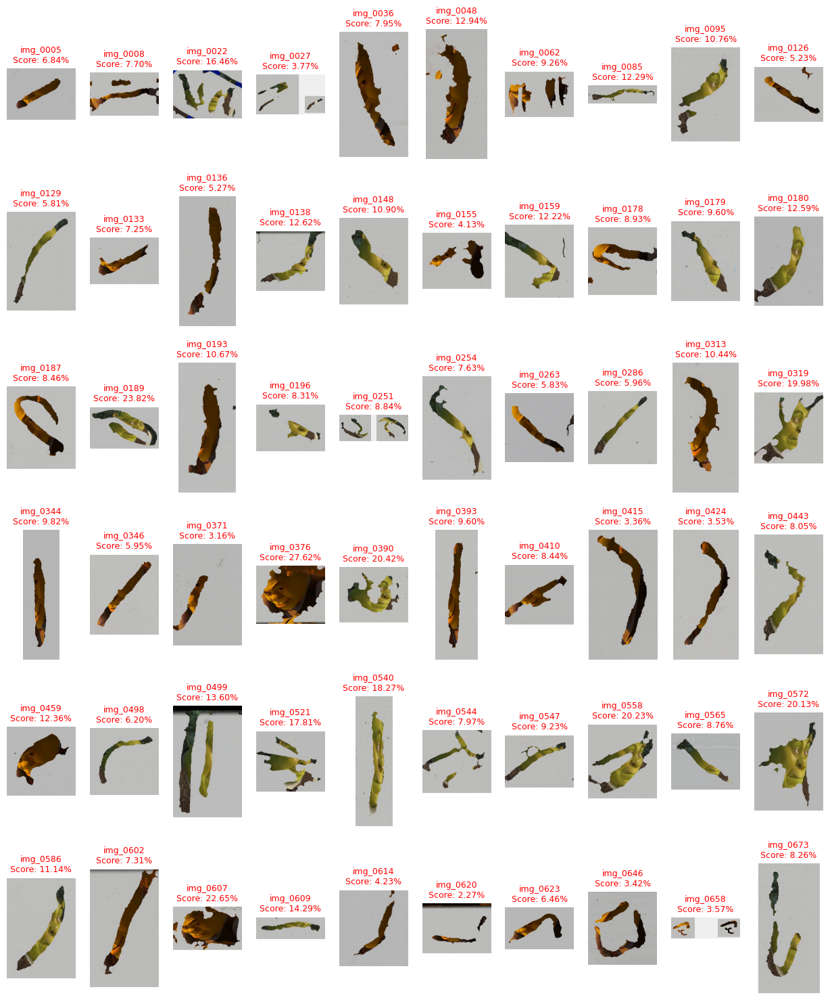

In [13]:
# --- 3. Plotting Miniatures ---
if len(shrek_images) > 0:
    # Configure Grid
    cols = 10
    rows = math.ceil(len(shrek_images) / cols)

    # Create Figure
    fig, axes = plt.subplots(rows, cols, figsize=(12.5, 2.5 * rows))

    # Flatten axes array for easy iteration (handles single row case too)
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (idx, img_id, ratio) in enumerate(shrek_images):
        # Fetch image again for visualization
        img = ds_train_splatter_free.image(idx)

        ax = axes[i]
        ax.imshow(img)
        # Title with ID and Green Score
        ax.set_title(f"{img_id}\nScore: {ratio:.2%}", fontsize=9, color='red')
        ax.axis('off')

    # Turn off any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No Shrek detected. Try lowering the threshold if you are sure they exist.")

Plotting 581 clean images in batches of 50.


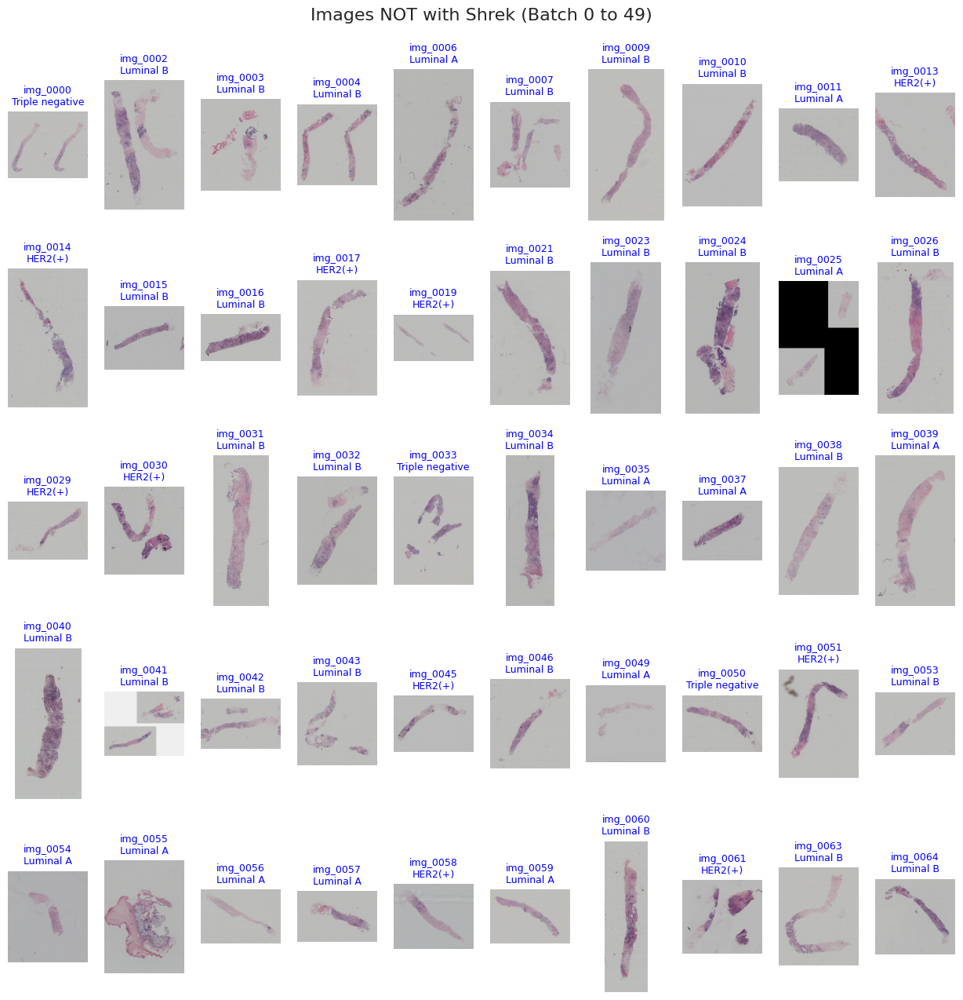

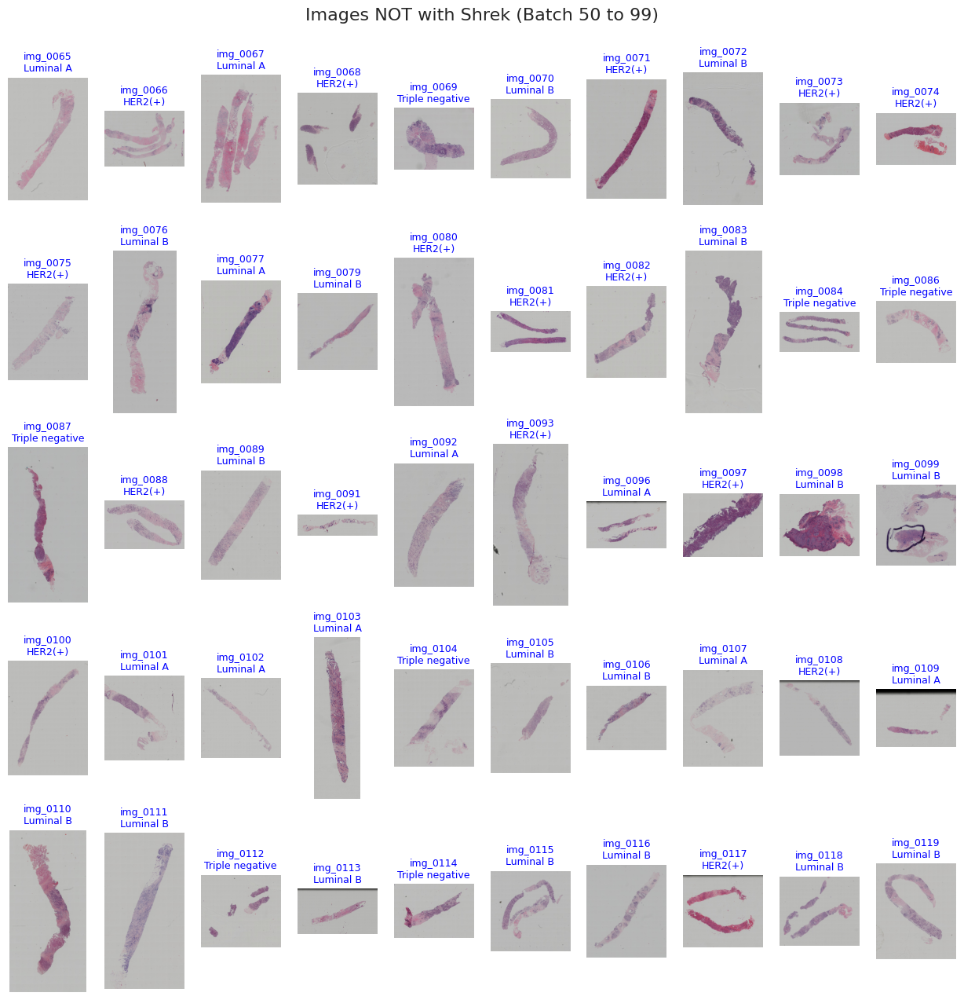

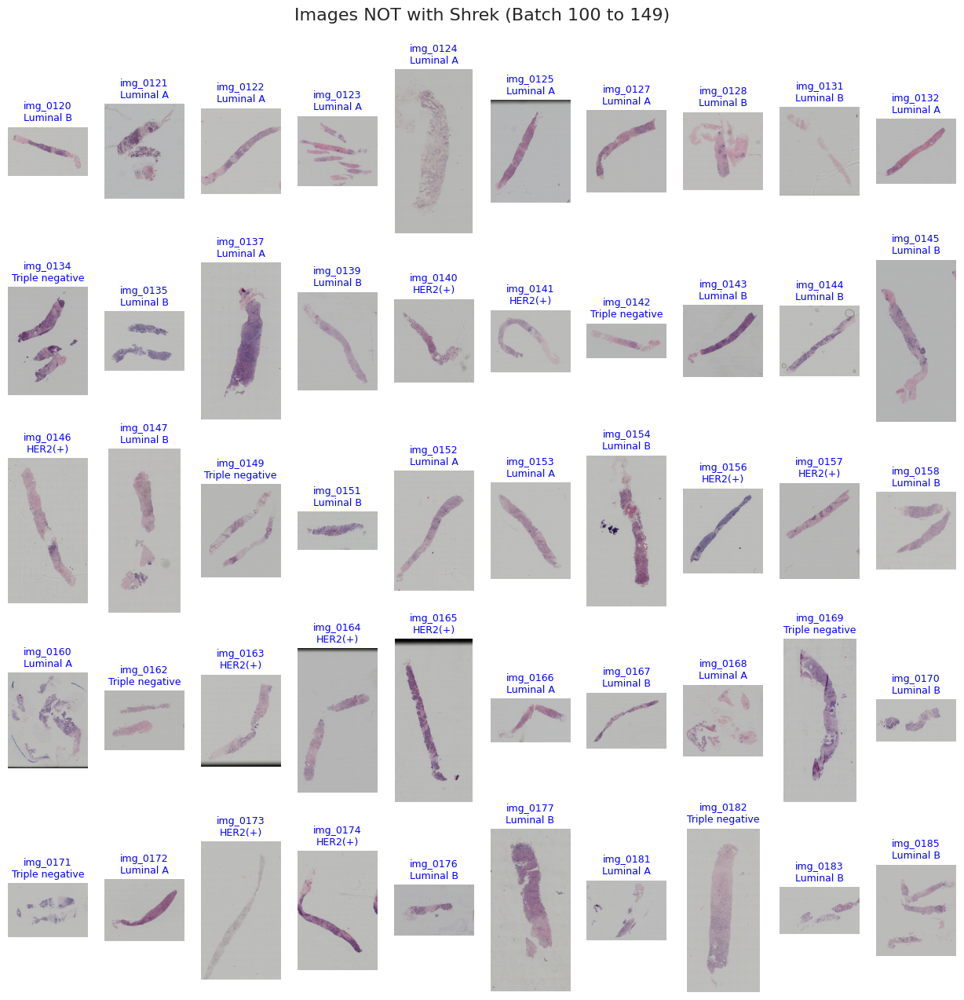

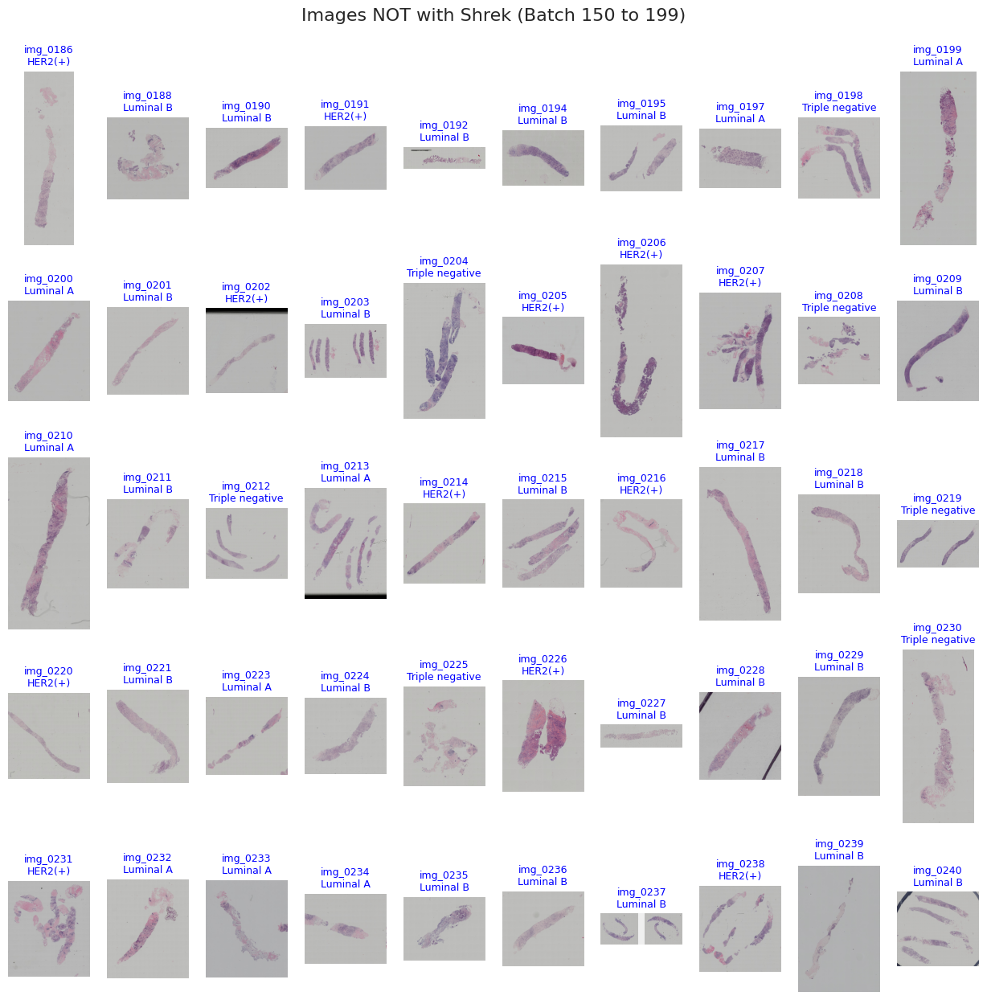

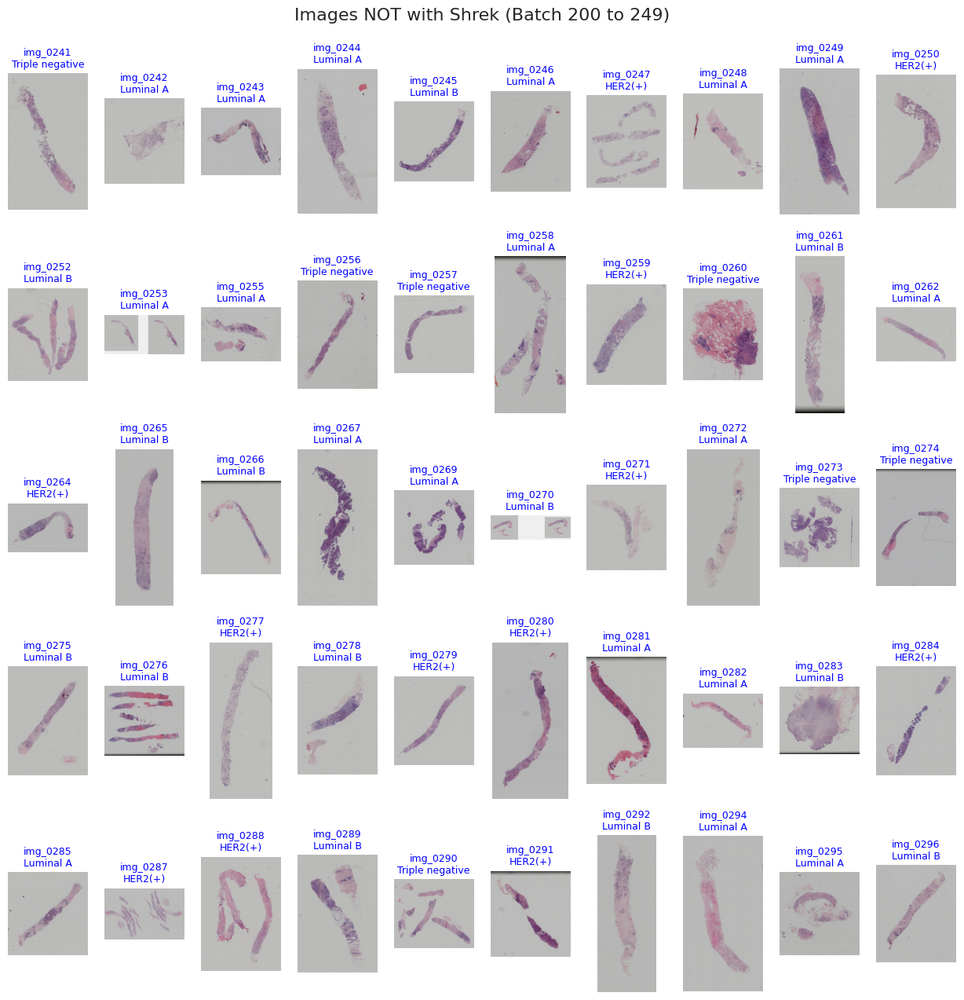

...

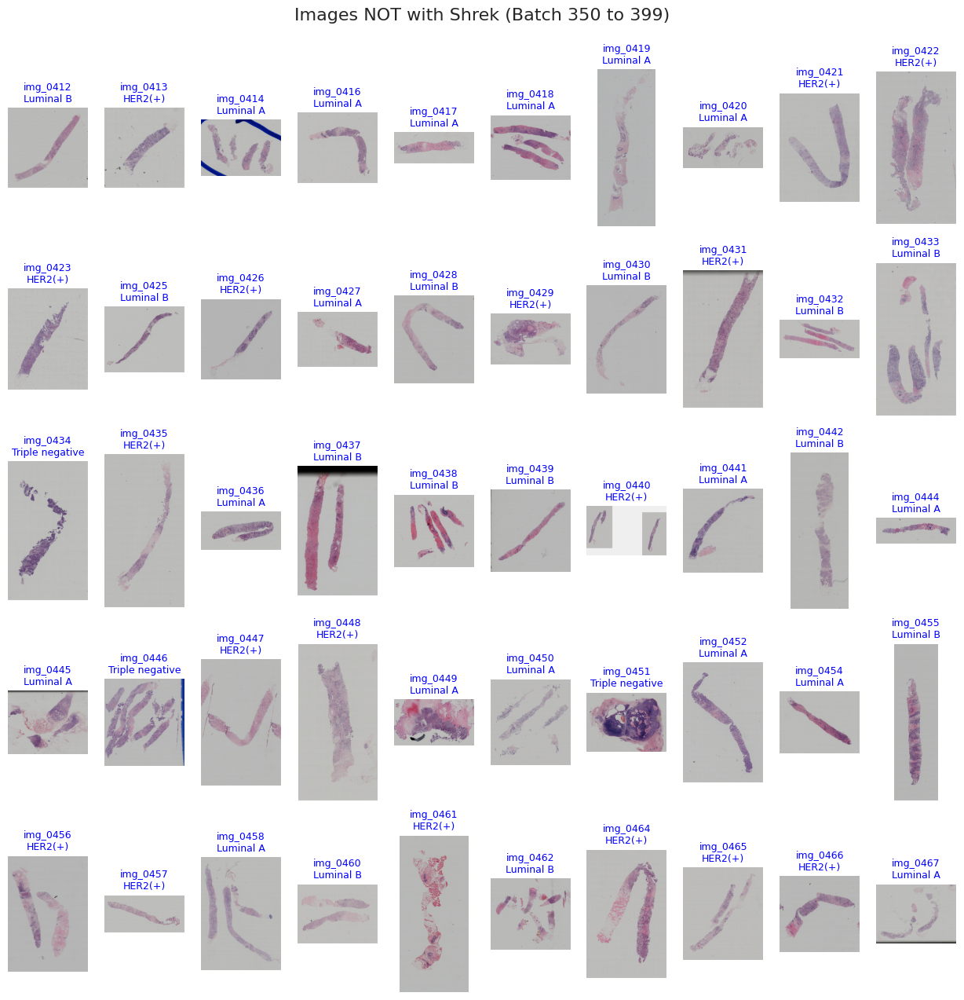

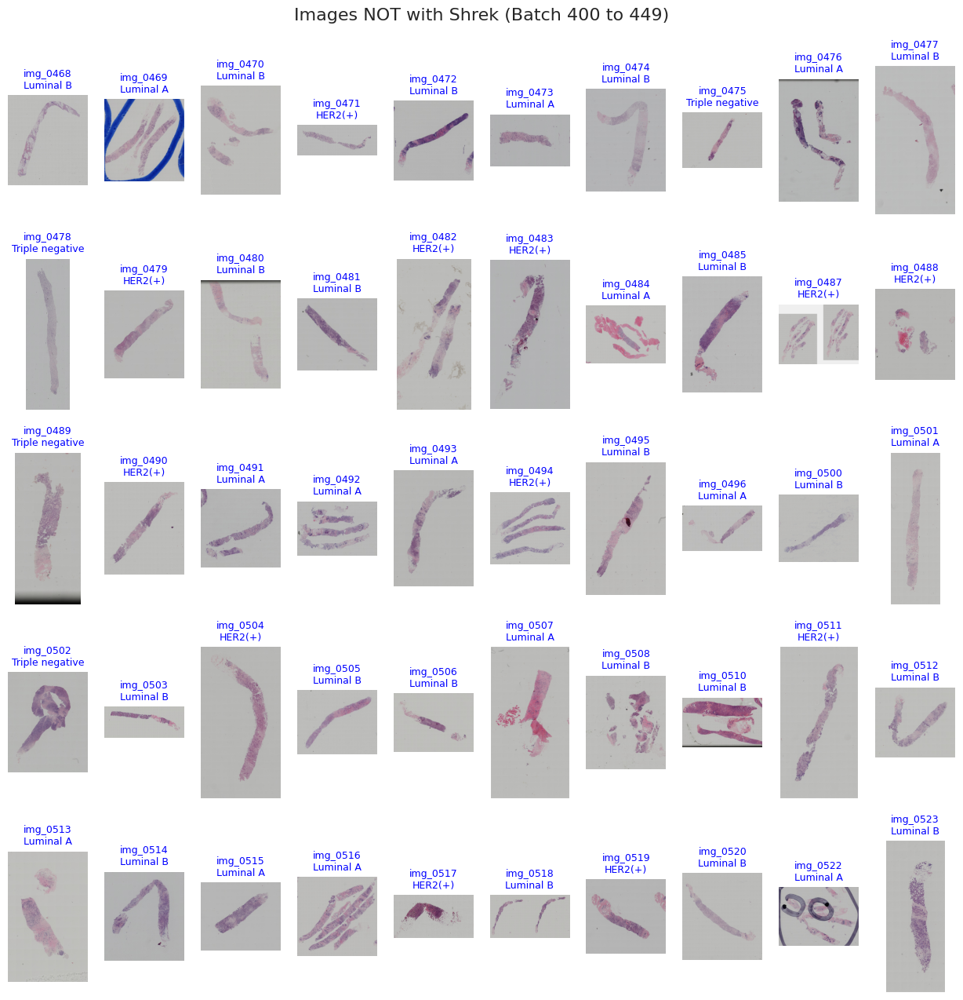

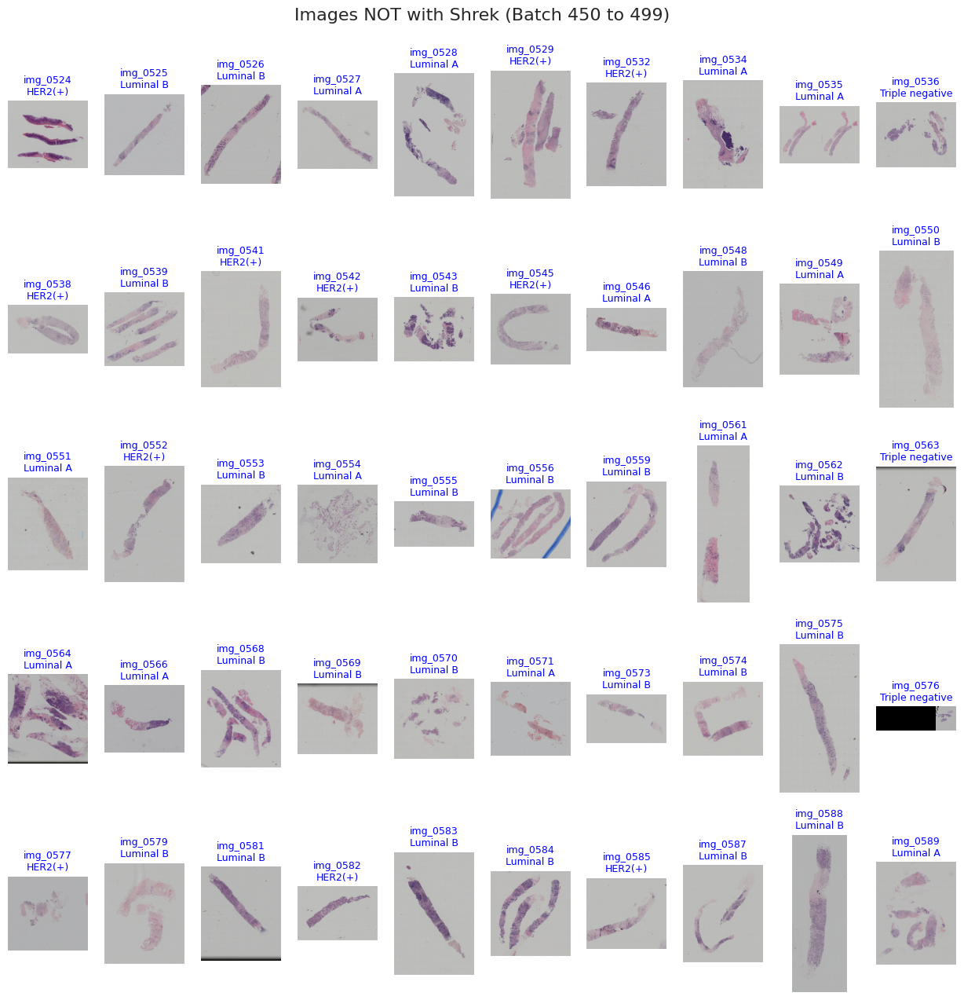

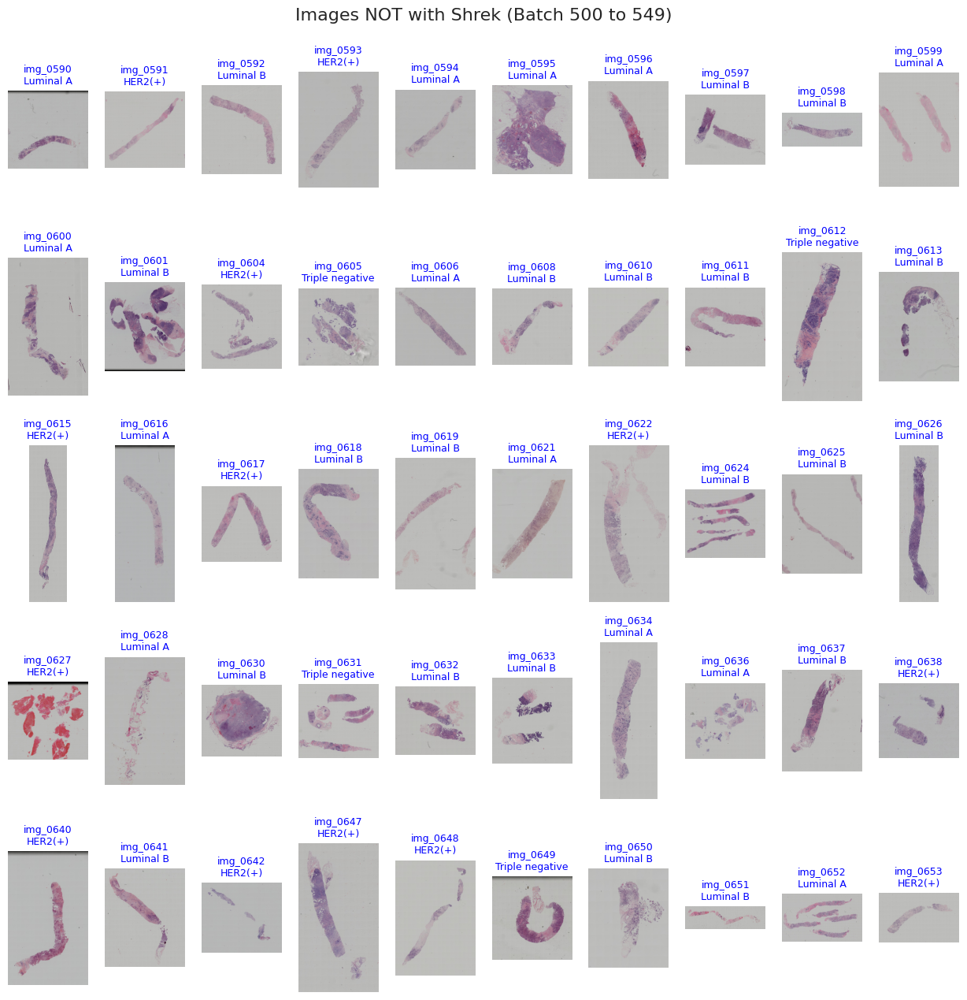

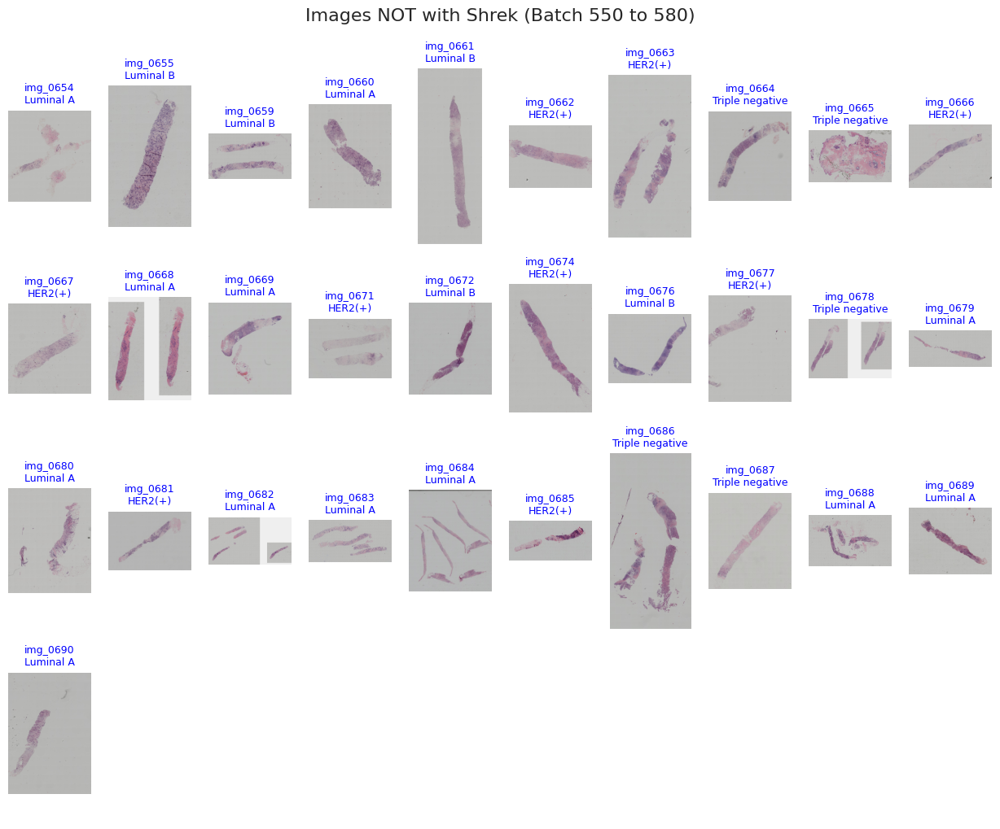

In [14]:
# --- Plotting Miniatures --- This cell plots images that are NOT shrek images

# 1. Get a set of image IDs that ARE shrek images for efficient lookup
shrek_image_ids = {item[1] for item in shrek_images}

# 2. Collect indices and IDs of images that are NOT shrek images
non_shrek_images_full_list = []
for idx in range(len(ds_train_splatter_free)):
    full_filename = ds_train_splatter_free.image_filenames[idx]
    image_id = os.path.splitext(full_filename)[0]
    if image_id not in shrek_image_ids:
        # Add a placeholder ratio (e.g., 0) as it's not relevant for non-Shrek images
        # Also add the label for display
        label_str = ds_train_splatter_free.labels[idx]
        non_shrek_images_full_list.append((idx, image_id, 0, label_str))

# --- Plotting All Images in Batches (Page Fashion) ---
BATCH_SIZE_PER_PLOT = 50 # Number of images to plot in each figure/page
cols_per_plot = 10 # Number of columns for subplots in each figure

if len(non_shrek_images_full_list) > 0:
    print(f"Plotting {len(non_shrek_images_full_list)} clean images in batches of {BATCH_SIZE_PER_PLOT}.")
    print("Warning: Displaying many plots sequentially will still accumulate memory in the notebook output if figures are not explicitly closed. Reduce BATCH_SIZE_PER_PLOT if RAM issues occur.")

    for i in range(0, len(non_shrek_images_full_list), BATCH_SIZE_PER_PLOT):
        batch_images = non_shrek_images_full_list[i : i + BATCH_SIZE_PER_PLOT]

        num_images_in_batch = len(batch_images)
        rows_per_plot = math.ceil(num_images_in_batch / cols_per_plot)

        # Create a new figure for each batch
        fig, axes = plt.subplots(rows_per_plot, cols_per_plot, figsize=(12.5, 2.5 * rows_per_plot))

        # Flatten axes array for easy iteration (handles single row/column case too)
        if rows_per_plot == 1 and cols_per_plot == 1:
            axes = [axes]
        elif rows_per_plot == 1 or cols_per_plot == 1:
            axes = axes
        else:
            axes = axes.flatten()

        for j, (idx, img_id, ratio, label_str) in enumerate(batch_images):
            ax = axes[j]
            # Fetch image again for visualization
            img = ds_train_splatter_free.image(idx)
            ax.imshow(img)
            ax.set_title(f"{img_id}\n{label_str}", fontsize=9, color='blue')
            ax.axis('off')

        # Turn off any unused subplots in the current figure
        for k in range(num_images_in_batch, len(axes)):
            axes[k].axis('off')

        plt.tight_layout()
        plot_title = f"Images NOT with Shrek (Batch {i} to {min(i + BATCH_SIZE_PER_PLOT, len(non_shrek_images_full_list))-1})"
        plt.suptitle(plot_title, fontsize=16, y=1.02)
        plt.show()
        # If you need to aggressively manage RAM and don't mind plots disappearing from output after viewing,
        # uncomment the line below:
        # plt.close(fig)
else:
    print("No images found that are not Shrek. This is unexpected.")

### 🧹 **Cleanup dataset, segregate Shrek**

In [15]:
# --- Configuration ---
# Source directory (where your original train_data is)
SOURCE_DIR = ds_train_splatter_free.data_dir  # e.g., .../train_data
# Destination directories
CLEAN_DIR = os.path.join(ds_train.root_dir, 'train_data_clean')
SHREK_DIR = os.path.join(ds_train.root_dir, 'train_data_shrek')

# Create directories if they don't exist
os.makedirs(CLEAN_DIR, exist_ok=True)
os.makedirs(SHREK_DIR, exist_ok=True)

print(f"📂 Source: {SOURCE_DIR}")
print(f"✅ Clean Dest: {CLEAN_DIR}")
print(f"🧌 Shrek Dest: {SHREK_DIR}")

# --- Preparation ---
# 1. Create a set of Shrek IDs for O(1) fast lookup
# shrek_images is a list of tuples: (index, image_id, ratio)
# We assume image_id is "img_XXXX" (without extension)
shrek_ids_set = set([item[1] for item in shrek_images])

# 2. Get list of all files in source
all_files = os.listdir(SOURCE_DIR)

# --- Execution ---
print("\n🚀 Starting Copy Process...")

copy_count_clean = 0
copy_count_shrek = 0

for filename in tqdm(all_files):
    # Skip non-files (directories) if any
    if not os.path.isfile(os.path.join(SOURCE_DIR, filename)):
        continue

    # We only care about images/masks, not random system files
    # Check if it's an image or a mask belonging to an image
    name_without_ext = os.path.splitext(filename)[0]

    # Heuristic: Check if the file is associated with a shrek ID
    # If filename is "img_0123.png", ID is "img_0123" -> Check set
    # If filename is "mask_0123.png", we need to map it to "img_0123" to check set

    is_shrek = False

    if filename.startswith("img_"):
        if name_without_ext in shrek_ids_set:
            is_shrek = True

    elif filename.startswith("mask_"):
        # Convert "mask_0123" -> "img_0123" to check against our shrek list
        associated_img_id = name_without_ext.replace("mask_", "img_")
        if associated_img_id in shrek_ids_set:
            is_shrek = True

    # Construct paths
    src_path = os.path.join(SOURCE_DIR, filename)

    if is_shrek:
        dst_path = os.path.join(SHREK_DIR, filename)
        shutil.copy2(src_path, dst_path) # copy2 preserves metadata
        copy_count_shrek += 1
    else:
        dst_path = os.path.join(CLEAN_DIR, filename)
        shutil.copy2(src_path, dst_path)
        copy_count_clean += 1

print("\n--- Summary ---")
print(f"✅ Clean files copied: {copy_count_clean}")
print(f"🧌 Shrek files copied: {copy_count_shrek}")
print("Done.")

📂 Source: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data_splatter_free
✅ Clean Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data_clean
🧌 Shrek Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_data_shrek

🚀 Starting Copy Process...


100%|██████████| 1282/1282 [00:49<00:00, 25.78it/s]


--- Summary ---
✅ Clean files copied: 1162
🧌 Shrek files copied: 120
Done.


In [16]:
# --- Configuration ---
original_csv_path = os.path.join(ds_train.root_dir, 'train_labels_splatter_free.csv')
new_csv_path = os.path.join(ds_train.root_dir, 'train_labels_clean.csv')

# --- Execution ---
print(f"Reading labels from: {original_csv_path}")
df = pd.read_csv(original_csv_path)
initial_count = len(df)

# 1. Create a Set of "Bad" IDs for fast lookup
# shrek_images contains tuples like (index, "img_1234", score)
# We extracted the ID without extension previously.
bad_ids_set = set([item[1] for item in shrek_images])

print(f"Filtering out {len(bad_ids_set)} Shrek images...")

# 2. Filter the DataFrame
# We need to extract the ID from the CSV 'sample_index' (which is "img_XXXX.png")
# to match the IDs in our bad_ids_set (which is "img_XXXX")

def extract_id(filename):
    return os.path.splitext(filename)[0]

# Create a boolean mask: True if the row's ID is in the bad set
# We use apply() to handle the extension stripping safely
mask_is_shrek = df['sample_index'].apply(extract_id).isin(bad_ids_set)

# Select rows that are NOT Shrek (~)
df_clean = df[~mask_is_shrek].copy()

# 3. Save the new CSV
df_clean.to_csv(new_csv_path, index=False)

# --- Summary ---
print("\n--- CSV Creation Summary ---")
print(f"Original rows:  {initial_count}")
print(f"Removed rows:   {mask_is_shrek.sum()}")
print(f"Remaining rows: {len(df_clean)}")
print(f"✅ Labels Dest: {new_csv_path}")

# Sanity Check: Print first few rows of the new CSV
print("\nHead of new CSV:")
print(df_clean.head())

Reading labels from: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_labels_splatter_free.csv
Filtering out 60 Shrek images...

--- CSV Creation Summary ---
Original rows:  641
Removed rows:   60
Remaining rows: 581
✅ Labels Dest: /gdrive/My Drive/Colab Notebooks/[2025-2026] AN2DL/Second Challenge 2/grumpy-doctogres/train_labels_clean.csv

Head of new CSV:
   sample_index            label
0  img_0000.png  Triple negative
1  img_0002.png        Luminal B
2  img_0003.png        Luminal B
3  img_0004.png        Luminal B
5  img_0006.png        Luminal A


## 📥 **Splatter and Shrek -free data loading**

In [17]:
# Load splatter and Shrek -free dataset
ds_train_clean = GrumpyDoctogresDataset(
    mode='train', root_dir=dataset_dir,
    data_dir='train_data_clean',
    labels_df=pd.read_csv(os.path.join(dataset_dir, 'train_labels_clean.csv')))
print(f"Loaded {len(ds_train_clean)} training samples.")

Loaded 581 training samples.


## 📊 **Label distribution check**

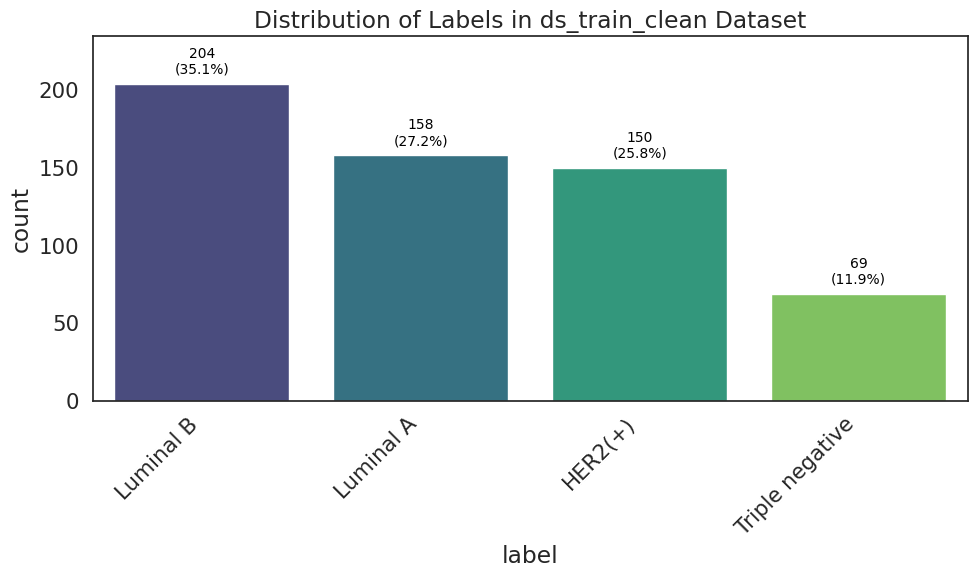

In [18]:
df_labels = ds_train_clean.df_labels.copy()

plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df_labels, x='label', palette='viridis', order=df_labels['label'].value_counts().index)
plt.title('Distribution of Labels in ds_train_clean Dataset')
plt.ylabel('count')
plt.xticks(rotation=45, ha='right')

total = len(df_labels)

# Find the maximum height of any bar
max_height = 0
for p in ax.patches:
    if p.get_height() > max_height:
        max_height = p.get_height()

# Set y-axis limit slightly higher than the maximum bar height to accommodate annotations
ax.set_ylim(0, max_height * 1.15) # Add 15% extra space at the top

for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(f'{int(p.get_height())}\n({percentage})', (x, y), ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.show()

---

---

In [19]:
non_1024_images = []

print(f"Checking dimensions for {len(ds_train_clean)} images in ds_train_clean...")

for idx in tqdm(range(len(ds_train_clean))):
    img = ds_train_clean.image(idx)
    height, width, _ = img.shape

    if height != 1024 and width != 1024:
        image_id = os.path.splitext(ds_train_clean.image_filenames[idx])[0]
        non_1024_images.append({'id': image_id, 'dimensions': (height, width)})

print("\n--- Dimension Check Summary ---")
if len(non_1024_images) == 0:
    print("✅ All images in ds_train_clean have at least one dimension of 1024.")
else:
    print(f"❌ {len(non_1024_images)} images do not have at least one dimension of 1024:")
    for item in non_1024_images:
        print(f"  - Image ID: {item['id']}, Dimensions: {item['dimensions']}")


Checking dimensions for 581 images in ds_train_clean...


100%|██████████| 581/581 [00:44<00:00, 13.14it/s]


--- Dimension Check Summary ---
✅ All images in ds_train_clean have at least one dimension of 1024.
